# SegFormer-B0 Fine-tune — Pseudo-label + Sidewalk Supervision (Partially Unfrozen)

Fine-tunes **encoder stages 2–3 + decode head** of `nvidia/segformer-b0-finetuned-cityscapes-512-1024`.
Encoder stages 0–1 remain frozen. LR lowered to 3e-5 to avoid destroying pretrained features.

**Label construction per image:**
1. Run base B0 on the image → 19-class pseudo-label for every pixel
2. Overwrite confirmed sidewalk polygons (dataset cats 0 & 3) with class 1

This gives every pixel a label — B0 fills in cars/buildings/road/sky, the dataset anchors the sidewalk.
The model is penalised for wrong sidewalk predictions AND for forgetting other classes.

| Dataset class | Action |
|---|---|
| Sidewalks (0) → class 1 | **Overwrite** pseudo-label with real sidewalk |
| sidewalk (3) → class 1 | **Overwrite** pseudo-label with real sidewalk |
| Roadway (1) / downstairs (2) / upstairs (4) | Keep base-B0 pseudo-label |
| Unannotated background | Keep base-B0 pseudo-label |

Checkpoint → `../models/segformer_b0_pseudo_unfrozen_finetuned.pth`

## 1. Imports & config

In [4]:
import json, time
from pathlib import Path
from collections import defaultdict

import numpy as np
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from PIL import Image, ImageDraw
from tqdm import tqdm
from transformers import AutoImageProcessor, SegformerForSemanticSegmentation

# ── paths ──────────────────────────────────────────────────────────────────
DATASET_ROOT = Path('../../../../datasets/sidewalk_segmentation')
MODEL_DIR    = Path('../models')
MODEL_DIR.mkdir(exist_ok=True)

CKPT_OUT = MODEL_DIR / 'segformer_b0_pseudo_unfrozen_finetuned.pth'
BASE_ID  = 'nvidia/segformer-b0-finetuned-cityscapes-512-1024'

# ── training hyper-params ──────────────────────────────────────────────────
IMG_SIZE    = 512
BATCH_SIZE  = 8
NUM_EPOCHS  = 20
LR          = 3e-5   # lower LR — encoder weights are pretrained
WEIGHT_DECAY= 0.01
IGNORE_IDX  = 255

# Dataset category ids that should overwrite pseudo-labels with confirmed sidewalk.
# Everything else keeps the base-B0 prediction.
SIDEWALK_CATS = {0: 1, 3: 1}   # cat 0 = "Sidewalks", cat 3 = "sidewalk"

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Device  :', DEVICE)
if DEVICE == 'cuda':
    print('GPU     :', torch.cuda.get_device_name(0))
print('Out ckpt:', CKPT_OUT)

Device  : cuda
GPU     : NVIDIA GeForce RTX 2080
Out ckpt: ..\models\segformer_b0_pseudo_unfrozen_finetuned.pth


## 2. Dataset

In [5]:
class SidewalkDataset(Dataset):
    def __init__(self, split: str, processor, pseudo_labels: dict):
        """
        pseudo_labels: {img_id: np.uint8 array (H×W, 19-class B0 prediction)}
                       Used as the base label; confirmed sidewalk polygons overwrite it.
        """
        root = DATASET_ROOT / split
        with open(root / '_annotations.coco.json') as f:
            coco = json.load(f)

        self.root      = root
        self.processor = processor
        self.pseudo    = pseudo_labels
        self.id2img    = {img['id']: img for img in coco['images']}

        self.img2anns = defaultdict(list)
        for ann in coco['annotations']:
            self.img2anns[ann['image_id']].append(ann)

        self.img_ids     = [i for i in self.id2img if self.img2anns[i]]
        self._label_cache: dict = {}

    def __len__(self):
        return len(self.img_ids)

    def _make_label(self, img_id: int, w: int, h: int) -> Image.Image:
        if img_id in self._label_cache:
            return Image.fromarray(self._label_cache[img_id])

        # Start from B0 pseudo-label (all 19 classes covered, no 255 pixels)
        if img_id in self.pseudo:
            label = Image.fromarray(self.pseudo[img_id].copy())
        else:
            label = Image.new('L', (w, h), IGNORE_IDX)

        # Overwrite confirmed sidewalk polygons with class 1
        draw = ImageDraw.Draw(label)
        for ann in self.img2anns[img_id]:
            cls = SIDEWALK_CATS.get(ann['category_id'])
            if cls is None:
                continue
            for seg in ann['segmentation']:
                if len(seg) < 6:
                    continue
                pts = [(seg[i], seg[i + 1]) for i in range(0, len(seg), 2)]
                draw.polygon(pts, fill=cls)

        self._label_cache[img_id] = np.array(label)
        return label

    def __getitem__(self, idx):
        img_id = self.img_ids[idx]
        meta   = self.id2img[img_id]
        img    = Image.open(self.root / meta['file_name']).convert('RGB')
        label  = self._make_label(img_id, *img.size)

        enc = self.processor(
            images=img,
            segmentation_maps=label,
            return_tensors='pt',
        )
        return {
            'pixel_values': enc['pixel_values'].squeeze(0),
            'labels':       enc['labels'].squeeze(0).long(),
        }

## 3. Load processor & model — freeze backbone

In [6]:
processor = AutoImageProcessor.from_pretrained(
    BASE_ID,
    size={'height': IMG_SIZE, 'width': IMG_SIZE},
    do_reduce_labels=False,
    ignore_index=IGNORE_IDX,
)

model = SegformerForSemanticSegmentation.from_pretrained(BASE_ID)

# Freeze everything first
for param in model.parameters():
    param.requires_grad = False

# Unfreeze encoder stages 2 & 3 + decode head — matched by parameter name
# (avoids relying on internal module hierarchy which changed in transformers 5.x)
UNFREEZE_PATTERNS = [
    'patch_embeddings.2', 'patch_embeddings.3',
    'block.2',            'block.3',
    'layer_norm.2',       'layer_norm.3',
    'decode_head',
]
for name, param in model.named_parameters():
    if any(p in name for p in UNFREEZE_PATTERNS):
        param.requires_grad = True

total     = sum(p.numel() for p in model.parameters())
trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f'Total params    : {total/1e6:.2f} M')
print(f'Trainable params: {trainable/1e6:.2f} M  (encoder stages 2-3 + decode head)')
print(f'Frozen params   : {(total-trainable)/1e6:.2f} M  (encoder stages 0-1)')

model = model.to(DEVICE)

Loading weights:   0%|          | 0/208 [00:00<?, ?it/s]

Total params    : 3.72 M
Trainable params: 0.40 M  (encoder stages 2-3 + decode head)
Frozen params   : 3.32 M  (encoder stages 0-1)


## 3b. Generate pseudo-labels with base B0

Run the **frozen base model** on every train & val image once.
These become the starting label canvas — the dataset's sidewalk polygons overwrite them in the next step.

In [7]:
def build_pseudo_labels(split: str, proc, base_m) -> dict:
    """Return {img_id: np.uint8 H×W} with base-B0 predictions at original image size."""
    root = DATASET_ROOT / split
    with open(root / '_annotations.coco.json') as f:
        coco = json.load(f)
    id2img = {img['id']: img for img in coco['images']}

    pseudo = {}
    base_m.eval()
    with torch.no_grad():
        for img_id, meta in tqdm(id2img.items(), desc=f'Pseudo-labels [{split}]'):
            img  = Image.open(root / meta['file_name']).convert('RGB')
            w, h = img.size
            inp  = proc(images=img, return_tensors='pt').to(DEVICE)
            out  = base_m(**inp)
            seg  = proc.post_process_semantic_segmentation(
                out, target_sizes=[(h, w)]
            )[0].cpu().numpy().astype(np.uint8)
            pseudo[img_id] = seg
    return pseudo

_base_proc_full = AutoImageProcessor.from_pretrained(BASE_ID)

print('Generating pseudo-labels (runs once, cached in memory)...')
train_pseudo = build_pseudo_labels('train', _base_proc_full, model)
val_pseudo   = build_pseudo_labels('valid', _base_proc_full, model)
print(f'Done — train: {len(train_pseudo)}, val: {len(val_pseudo)} images')

Generating pseudo-labels (runs once, cached in memory)...


Pseudo-labels [valid]: 100%|██████████| 243/243 [00:08<00:00, 30.27it/s]

Done — train: 1547, val: 243 images


## 4. DataLoaders

In [8]:
train_ds = SidewalkDataset('train', processor, pseudo_labels=train_pseudo)
val_ds   = SidewalkDataset('valid', processor, pseudo_labels=val_pseudo)

train_dl = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,
                      num_workers=0, pin_memory=False)
val_dl   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False,
                      num_workers=0, pin_memory=False)

print(f'Train: {len(train_ds)} images  ({len(train_dl)} batches)')
print(f'Val  : {len(val_ds)} images  ({len(val_dl)} batches)')

Train: 1319 images  (165 batches)
Val  : 202 images  (26 batches)


## 4b. Visualise training labels — dataset annotations vs combined GT

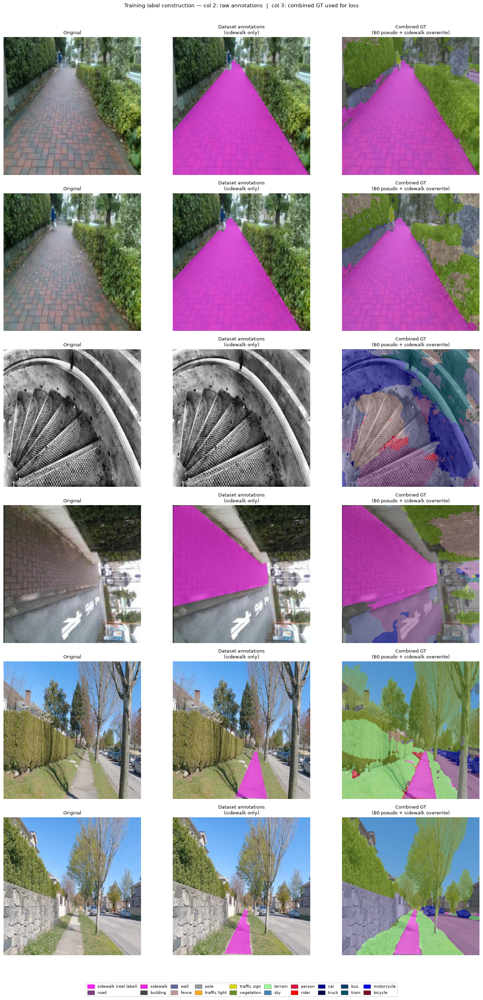

In [9]:
import random
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

CITYSCAPES_COLORS = np.array([
    [128,  64, 128], [244,  35, 232], [ 70,  70,  70], [102, 102, 156],
    [190, 153, 153], [153, 153, 153], [250, 170,  30], [220, 220,   0],
    [107, 142,  35], [152, 251, 152], [ 70, 130, 180], [220,  20,  60],
    [255,   0,   0], [  0,   0, 142], [  0,   0,  70], [  0,  60, 100],
    [  0,  80, 100], [  0,   0, 230], [119,  11,  32],
], dtype=np.uint8)
CITYSCAPES_CLASSES = [
    'road','sidewalk','building','wall','fence','pole',
    'traffic light','traffic sign','vegetation','terrain','sky',
    'person','rider','car','truck','bus','train','motorcycle','bicycle',
]
SIDEWALK_COLOR = CITYSCAPES_COLORS[1]

def _overlay_dataset_only(img, img_id, alpha=0.65):
    """Highlight only the confirmed sidewalk polygons from the dataset."""
    arr  = np.array(img)
    out  = arr.copy()
    mask = Image.new('L', img.size, 0)
    draw = ImageDraw.Draw(mask)
    for ann in train_ds.img2anns[img_id]:
        if ann['category_id'] not in SIDEWALK_CATS:
            continue
        for seg in ann['segmentation']:
            if len(seg) < 6:
                continue
            pts = [(seg[i], seg[i+1]) for i in range(0, len(seg), 2)]
            draw.polygon(pts, fill=1)
    mask_arr = np.array(mask).astype(bool)
    out[mask_arr] = (arr[mask_arr] * (1 - alpha) + SIDEWALK_COLOR * alpha).clip(0, 255).astype(np.uint8)
    return out

def _overlay_combined_gt(img, img_id, alpha=0.55):
    """Show the full combined GT: pseudo-label everywhere, sidewalk overwritten."""
    w, h   = img.size
    gt_arr = np.array(train_ds._make_label(img_id, w, h))
    orig   = np.array(img)
    colors = CITYSCAPES_COLORS[np.clip(gt_arr, 0, 18)]
    return (orig * (1 - alpha) + colors * alpha).clip(0, 255).astype(np.uint8)

# ── sample 6 training images ──────────────────────────────────────────────
N = 6
sample_ids = random.sample(train_ds.img_ids, min(N, len(train_ds.img_ids)))

fig, axes = plt.subplots(N, 3, figsize=(15, 4.5 * N))
COLS = ['Original', 'Dataset annotations\n(sidewalk only)', 'Combined GT\n(B0 pseudo + sidewalk overwrite)']

for row, img_id in enumerate(sample_ids):
    meta = train_ds.id2img[img_id]
    img  = Image.open(train_ds.root / meta['file_name']).convert('RGB')

    axes[row][0].imshow(img)
    axes[row][1].imshow(_overlay_dataset_only(img, img_id))
    axes[row][2].imshow(_overlay_combined_gt(img, img_id))

    for ax, title in zip(axes[row], COLS):
        ax.set_title(title, fontsize=9)
        ax.axis('off')

sw_patch  = mpatches.Patch(color=tuple(c/255 for c in SIDEWALK_COLOR), label='sidewalk (real label)')
cs_patches = [
    mpatches.Patch(facecolor=tuple(c/255 for c in CITYSCAPES_COLORS[i]),
                   edgecolor='#444', linewidth=0.4, label=CITYSCAPES_CLASSES[i])
    for i in range(len(CITYSCAPES_CLASSES))
]
fig.legend(handles=[sw_patch] + cs_patches, loc='lower center',
           ncol=10, fontsize=8, frameon=True, bbox_to_anchor=(0.5, -0.04),
           handlelength=1.8, handleheight=1.2, columnspacing=0.8)
plt.suptitle('Training label construction — col 2: raw annotations  |  col 3: combined GT used for loss',
             fontsize=11, y=1.005)
plt.tight_layout()
plt.show()

## 5. Optimizer & scheduler

In [10]:
optimizer = torch.optim.AdamW(
    [p for p in model.parameters() if p.requires_grad],
    lr=LR, weight_decay=WEIGHT_DECAY,
)

# Cosine annealing over all training steps
total_steps = NUM_EPOCHS * len(train_dl)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer, T_max=total_steps, eta_min=1e-7,
)

print(f'Total training steps: {total_steps}')

Total training steps: 3300


## 6. Metric — sidewalk IoU

In [11]:
def compute_iou(preds: torch.Tensor, labels: torch.Tensor) -> float:
    """IoU for sidewalk (class 1) only."""
    pred_mask  = (preds  == 1)
    label_mask = (labels == 1) & (labels != IGNORE_IDX)
    intersection = (pred_mask & label_mask).sum().item()
    union        = (pred_mask | label_mask).sum().item()
    return intersection / union if union > 0 else float('nan')

## 7. Training loop

In [12]:
best_val_loss = float('inf')
history = {'train_loss': [], 'val_loss': [], 'sidewalk_iou': []}

for epoch in range(1, NUM_EPOCHS + 1):
    # ── train ──────────────────────────────────────────────────────────────
    model.train()
    train_losses = []
    pbar = tqdm(train_dl, desc=f'Epoch {epoch}/{NUM_EPOCHS} [train]', leave=False)
    for batch in pbar:
        pixel_values = batch['pixel_values'].to(DEVICE)
        labels       = batch['labels'].to(DEVICE)

        outputs = model(pixel_values=pixel_values, labels=labels)
        loss    = outputs.loss

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        scheduler.step()

        train_losses.append(loss.item())
        pbar.set_postfix(loss=f'{loss.item():.4f}')

    avg_train = np.mean(train_losses)

    # ── validate ────────────────────────────────────────────────────────────
    model.eval()
    val_losses, iou_scores = [], []

    with torch.no_grad():
        for batch in tqdm(val_dl, desc=f'Epoch {epoch}/{NUM_EPOCHS} [val]  ', leave=False):
            pixel_values = batch['pixel_values'].to(DEVICE)
            labels       = batch['labels'].to(DEVICE)

            outputs = model(pixel_values=pixel_values, labels=labels)
            val_losses.append(outputs.loss.item())

            logits = F.interpolate(outputs.logits, size=labels.shape[-2:],
                                   mode='bilinear', align_corners=False)
            preds = logits.argmax(dim=1)
            iou = compute_iou(preds.cpu(), labels.cpu())
            if not np.isnan(iou):
                iou_scores.append(iou)

    avg_val      = np.mean(val_losses)
    sidewalk_iou = np.mean(iou_scores) if iou_scores else float('nan')

    history['train_loss'].append(avg_train)
    history['val_loss'].append(avg_val)
    history['sidewalk_iou'].append(sidewalk_iou)

    print(f'Epoch {epoch:02d}/{NUM_EPOCHS}  '
          f'train={avg_train:.4f}  val={avg_val:.4f}  '
          f'sidewalk_IoU={sidewalk_iou:.3f}  '
          f'lr={scheduler.get_last_lr()[0]:.2e}')

    if avg_val < best_val_loss:
        best_val_loss = avg_val
        torch.save({
            'epoch':         epoch,
            'model_state':   model.state_dict(),
            'optimizer_state': optimizer.state_dict(),
            'val_loss':      avg_val,
            'sidewalk_iou':  sidewalk_iou,
        }, CKPT_OUT)
        print(f'  ✓ Saved best checkpoint  (val_loss={avg_val:.4f})')

print(f'\nDone. Best val loss: {best_val_loss:.4f}')
print(f'Checkpoint: {CKPT_OUT}')

Epoch 01/20  train=2.1253  val=1.2892  sidewalk_IoU=0.318  lr=2.98e-05
  ✓ Saved best checkpoint  (val_loss=1.2892)


Epoch 02/20  train=1.3225  val=0.7225  sidewalk_IoU=0.426  lr=2.93e-05
  ✓ Saved best checkpoint  (val_loss=0.7225)


Epoch 03/20  train=0.9558  val=0.4262  sidewalk_IoU=0.554  lr=2.84e-05
  ✓ Saved best checkpoint  (val_loss=0.4262)


Epoch 04/20  train=0.7879  val=0.3384  sidewalk_IoU=0.649  lr=2.71e-05
  ✓ Saved best checkpoint  (val_loss=0.3384)


Epoch 05/20  train=0.7104  val=0.3253  sidewalk_IoU=0.666  lr=2.56e-05
  ✓ Saved best checkpoint  (val_loss=0.3253)


Epoch 06/20  train=0.6811  val=0.3051  sidewalk_IoU=0.685  lr=2.38e-05
  ✓ Saved best checkpoint  (val_loss=0.3051)


Epoch 07/20  train=0.6671  val=0.2971  sidewalk_IoU=0.692  lr=2.18e-05
  ✓ Saved best checkpoint  (val_loss=0.2971)


Epoch 08/20  train=0.6501  val=0.2920  sidewalk_IoU=0.699  lr=1.97e-05
  ✓ Saved best checkpoint  (val_loss=0.2920)


Epoch 09/20  train=0.6433  val=0.2868  sidewalk_IoU=0.704  lr=1.74e-05
  ✓ Saved best checkpoint  (val_loss=0.2868)


Epoch 10/20  train=0.6192  val=0.2831  sidewalk_IoU=0.707  lr=1.50e-05
  ✓ Saved best checkpoint  (val_loss=0.2831)


Epoch 11/20  train=0.6250  val=0.2797  sidewalk_IoU=0.711  lr=1.27e-05
  ✓ Saved best checkpoint  (val_loss=0.2797)


Epoch 12/20  train=0.6264  val=0.2799  sidewalk_IoU=0.713  lr=1.04e-05


Epoch 13/20  train=0.5871  val=0.2797  sidewalk_IoU=0.715  lr=8.26e-06
  ✓ Saved best checkpoint  (val_loss=0.2797)


Epoch 14/20  train=0.5915  val=0.2766  sidewalk_IoU=0.718  lr=6.26e-06
  ✓ Saved best checkpoint  (val_loss=0.2766)


Epoch 15/20  train=0.5942  val=0.2773  sidewalk_IoU=0.717  lr=4.48e-06


Epoch 16/20  train=0.6180  val=0.2754  sidewalk_IoU=0.720  lr=2.96e-06
  ✓ Saved best checkpoint  (val_loss=0.2754)


Epoch 17/20  train=0.5876  val=0.2751  sidewalk_IoU=0.719  lr=1.73e-06
  ✓ Saved best checkpoint  (val_loss=0.2751)


Epoch 18/20  train=0.6086  val=0.2756  sidewalk_IoU=0.719  lr=8.32e-07


Epoch 19/20  train=0.5910  val=0.2756  sidewalk_IoU=0.720  lr=2.84e-07


Epoch 20/20  train=0.5959  val=0.2788  sidewalk_IoU=0.719  lr=1.00e-07

Done. Best val loss: 0.2751
Checkpoint: ..\models\segformer_b0_pseudo_unfrozen_finetuned.pth


## 8. Training curves

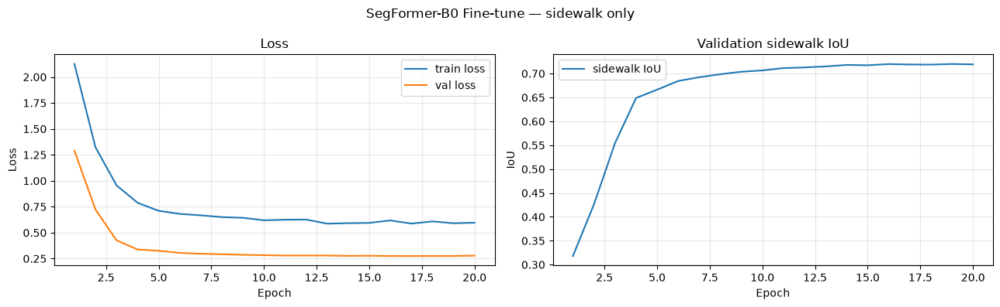

In [13]:
import matplotlib.pyplot as plt

epochs = range(1, len(history['train_loss']) + 1)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 4))

ax1.plot(epochs, history['train_loss'], label='train loss')
ax1.plot(epochs, history['val_loss'],   label='val loss')
ax1.set_xlabel('Epoch'); ax1.set_ylabel('Loss')
ax1.set_title('Loss'); ax1.legend(); ax1.grid(alpha=0.3)

ax2.plot(epochs, history['sidewalk_iou'], label='sidewalk IoU')
ax2.set_xlabel('Epoch'); ax2.set_ylabel('IoU')
ax2.set_title('Validation sidewalk IoU'); ax2.legend(); ax2.grid(alpha=0.3)

plt.suptitle('SegFormer-B0 Fine-tune — sidewalk only', fontsize=12)
plt.tight_layout()
plt.show()

## 9. Load best checkpoint & run inference

In [14]:
ckpt = torch.load(CKPT_OUT, map_location=DEVICE, weights_only=False)
model.load_state_dict(ckpt['model_state'])
model.eval()
print(f"Loaded checkpoint from epoch {ckpt['epoch']}")
print(f"  val_loss     : {ckpt['val_loss']:.4f}")
print(f"  sidewalk_IoU : {ckpt['sidewalk_iou']:.3f}")

Loaded checkpoint from epoch 17
  val_loss     : 0.2751
  sidewalk_IoU : 0.719


## 10. Visual comparison — base vs fine-tuned

Loading weights:   0%|          | 0/208 [00:00<?, ?it/s]

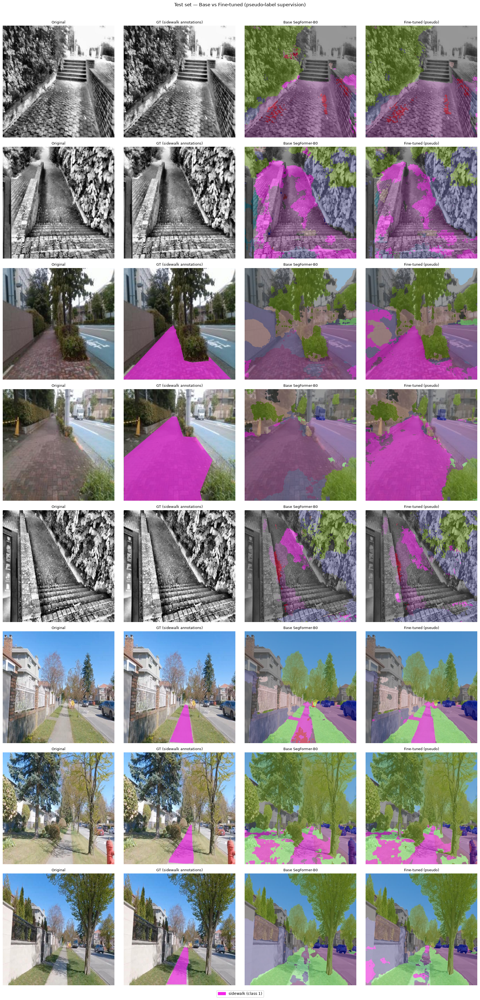

Test set: 118 images


In [15]:
import random, matplotlib.patches as mpatches
from transformers import AutoImageProcessor, SegformerForSemanticSegmentation

base_model = SegformerForSemanticSegmentation.from_pretrained(BASE_ID).to(DEVICE).eval()
base_proc  = AutoImageProcessor.from_pretrained(BASE_ID)

# Test dataset — pseudo_labels not needed, pass empty dict
test_ds = SidewalkDataset('test', processor, pseudo_labels={})

SIDEWALK_COLOR = CITYSCAPES_COLORS[1]

def infer(m, proc, pil_img):
    inp = proc(images=pil_img, return_tensors='pt').to(DEVICE)
    with torch.no_grad():
        out = m(**inp)
    return proc.post_process_semantic_segmentation(
        out, target_sizes=[pil_img.size[::-1]]
    )[0].cpu().numpy().astype(np.uint8)

def overlay_seg(img, seg, alpha=0.55):
    orig = np.array(img)
    mask = CITYSCAPES_COLORS[np.clip(seg, 0, 18)]
    return (orig * (1 - alpha) + mask * alpha).clip(0, 255).astype(np.uint8)

def overlay_sidewalk_gt(img, img_id, ds, alpha=0.65):
    """Highlight confirmed sidewalk polygons (raw dataset annotations only)."""
    arr  = np.array(img)
    out  = arr.copy()
    mask = Image.new('L', img.size, 0)
    draw = ImageDraw.Draw(mask)
    for ann in ds.img2anns[img_id]:
        if ann['category_id'] not in SIDEWALK_CATS:
            continue
        for seg in ann['segmentation']:
            if len(seg) < 6:
                continue
            pts = [(seg[i], seg[i+1]) for i in range(0, len(seg), 2)]
            draw.polygon(pts, fill=1)
    mask_arr = np.array(mask).astype(bool)
    out[mask_arr] = (arr[mask_arr] * (1 - alpha) + SIDEWALK_COLOR * alpha).clip(0, 255).astype(np.uint8)
    return out

# ── sample from test split ────────────────────────────────────────────────
N_EXAMPLES = 8
test_ids = random.sample(test_ds.img_ids, min(N_EXAMPLES, len(test_ds.img_ids)))

COLS = ['Original', 'GT (sidewalk annotations)', 'Base SegFormer-B0', 'Fine-tuned (pseudo)']
fig, axes = plt.subplots(len(test_ids), 4, figsize=(18, 4.5 * len(test_ids)))

for row, img_id in enumerate(test_ids):
    meta = test_ds.id2img[img_id]
    img  = Image.open(test_ds.root / meta['file_name']).convert('RGB')

    seg_base  = infer(base_model, base_proc, img)
    seg_tuned = infer(model,      processor,  img)

    axes[row][0].imshow(img)
    axes[row][1].imshow(overlay_sidewalk_gt(img, img_id, test_ds))
    axes[row][2].imshow(overlay_seg(img, seg_base))
    axes[row][3].imshow(overlay_seg(img, seg_tuned))

    for ax, title in zip(axes[row], COLS):
        ax.set_title(title, fontsize=9)
        ax.axis('off')

handles = [
    mpatches.Patch(color=tuple(c/255 for c in SIDEWALK_COLOR), label='sidewalk (class 1)'),
]
fig.legend(handles=handles, loc='lower center', ncol=1, fontsize=10,
           bbox_to_anchor=(0.5, -0.01))
plt.suptitle('Test set — Base vs Fine-tuned (pseudo-label supervision)',
             fontsize=12, y=1.005)
plt.tight_layout()
plt.show()
print(f'Test set: {len(test_ds)} images')